In [1]:
%cd ../

C:\Users\kenta\workspace\crack_segmentation


In [2]:
import os
from tqdm import tqdm_notebook as tqdm
import cv2 as cv
from shutil import copyfile

from glob import glob
from matplotlib import pyplot as plt
import numpy as np
from pathlib import Path
import torch
import torch.nn.functional as F
from torch.autograd import Variable
import torchvision.transforms as transforms
from unet.unet_transfer import UNet16, input_size
import matplotlib.pyplot as plt
import argparse
from os.path import join
from PIL import Image
import gc
from utils import load_unet_vgg16, load_unet_resnet_101, load_unet_resnet_34
from tqdm import tqdm
from prepare_image import split_image
import numpy as np
%matplotlib inline

In [3]:
from create_one_image import run

In [4]:
run(image_path='crack_image/side_A_B.jpg', down_index=1250, output_path='side_A_B_crack.jpg')

(2144, 62392) -> (1792, 62272)
(2144, 62392, 3) -> (1792, 62272, 3)


C:\Users\kenta\.conda\envs\crack\lib\site-packages\torch\nn\functional.py:1350: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


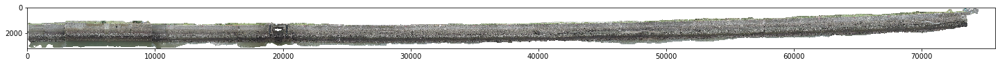

In [5]:
img = cv.imread("crack_image/Matsuyama_AreaE_2019.png")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

fig = plt.figure(figsize=(25, 4))
plt.imshow(img)
plt.show()

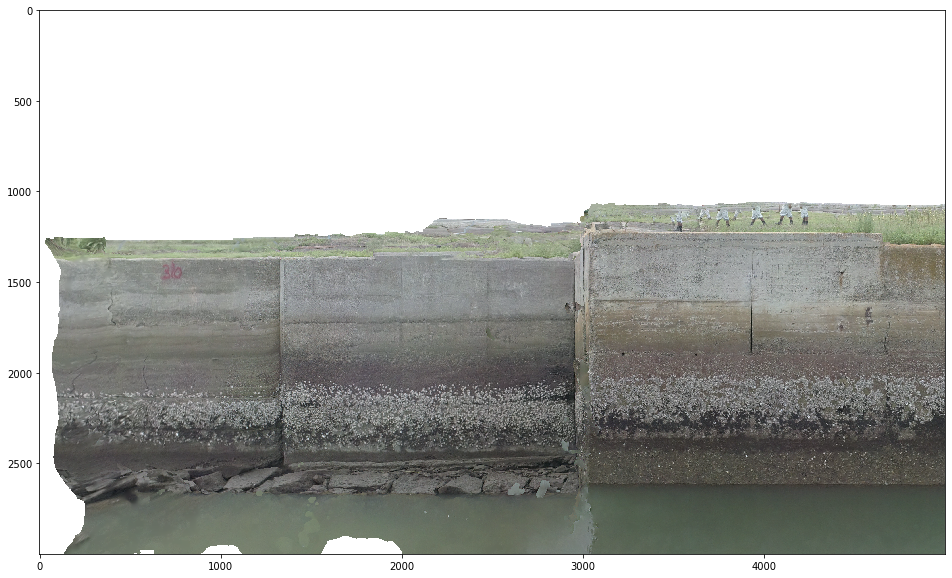

In [16]:
fig = plt.figure(figsize=(25, 10))
plt.imshow(img[:3000, 0:5000, :])
plt.show()

In [5]:
run(image_path='crack_image/Matsuyama_AreaE_2019.png', down_index=3000, output_path='Matsuyama_AreaE_2019_crack.png')

(3208, 75781) -> (3136, 75712)
(3208, 75781, 3) -> (3136, 75712, 3)


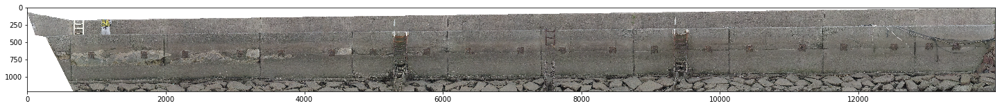

In [17]:
img = cv.imread("crack_image/Matsuyama_AreaG.png")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

fig = plt.figure(figsize=(25, 4))
plt.imshow(img)
plt.show()

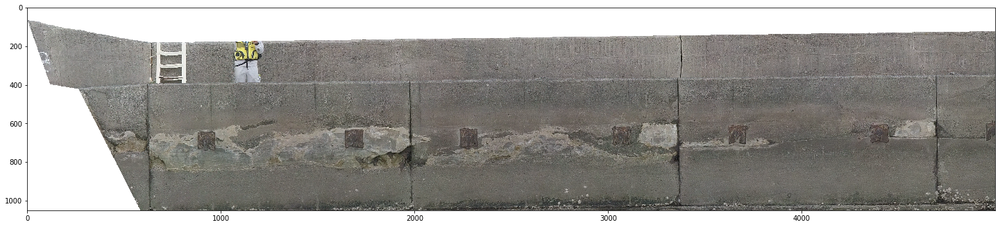

In [20]:
fig = plt.figure(figsize=(25, 10))
plt.imshow(img[:1050, 0:5000, :])
plt.show()

In [6]:
run(image_path='crack_image/Matsuyama_AreaG.png', down_index=1050, output_path='Matsuyama_AreaG_crack.png')

(1211, 13979) -> (896, 13888)
(1211, 13979, 3) -> (896, 13888, 3)


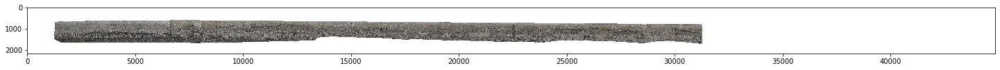

In [22]:
img = cv.imread("crack_image/Matsuyama_AreaHI.png")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

fig = plt.figure(figsize=(25, 4))
plt.imshow(img)
plt.show()

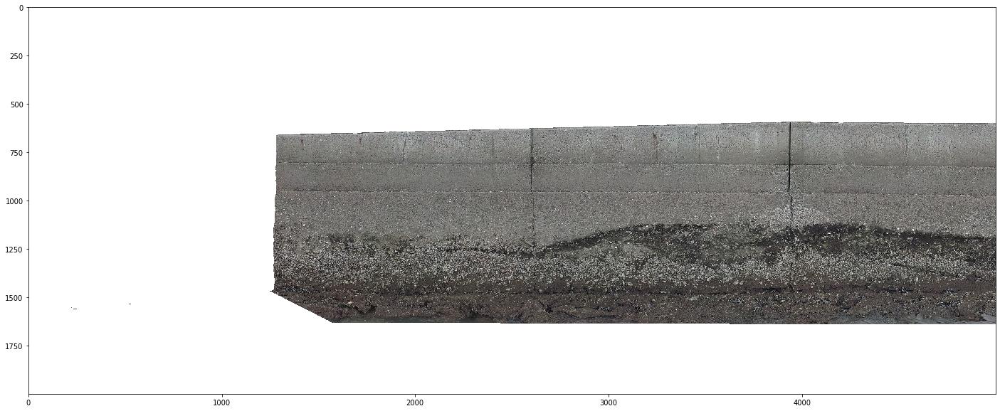

In [26]:
fig = plt.figure(figsize=(25, 10))
plt.imshow(img[:2000, 0:5000, :])
plt.show()

In [7]:
run(image_path='crack_image/Matsuyama_AreaHI.png', down_index=2000, output_path='Matsuyama_AreaHI_crack.png')

(2143, 44857) -> (1792, 44800)
(2143, 44857, 3) -> (1792, 44800, 3)


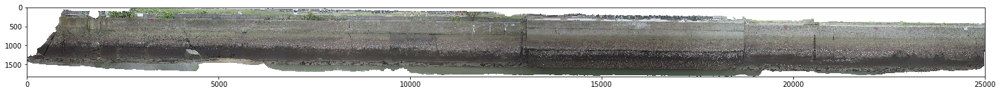

In [28]:
img = cv.imread("crack_image/Matsuyama_AreaJ_2019.png")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

fig = plt.figure(figsize=(25, 4))
plt.imshow(img)
plt.show()

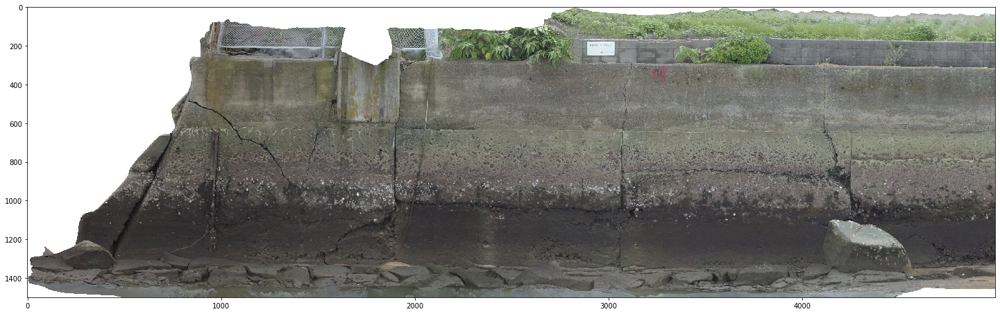

In [29]:
fig = plt.figure(figsize=(25, 10))
plt.imshow(img[:1500, 0:5000, :])
plt.show()

In [8]:
run(image_path='crack_image/Matsuyama_AreaJ_2019.png', down_index=1500, output_path='Matsuyama_AreaJ_2019_crack.png')

(1814, 25011) -> (1792, 24640)
(1814, 25011, 3) -> (1792, 24640, 3)


In [7]:
model = load_unet_resnet_101('models/model_best.pt')
train_tfms = transforms.Compose([transforms.ToTensor(), transforms.Normalize(channel_means, channel_stds)])
width = 448
height = 448
channel_means = [0.485, 0.456, 0.406]
channel_stds = [0.229, 0.224, 0.225]
threshold = 0.3

In [9]:
def evaluate_img(model, img):
    input_width, input_height = input_size[0], input_size[1]

    img_1 = cv.resize(img, (input_width, input_height), cv.INTER_AREA)
    X = train_tfms(Image.fromarray(img_1))
    X = Variable(X.unsqueeze(0)).cuda()  # [N, 1, H, W]

    mask = model(X)

    mask = F.sigmoid(mask[0, 0]).data.cpu().numpy()
    mask = cv.resize(mask, (width, height), cv.INTER_AREA)
    return mask


def evaluate_img_patch(model, img):
    input_width, input_height = input_size[0], input_size[1]

    img_height, img_width, img_channels = img.shape

    if img_width < input_width or img_height < input_height:
        return evaluate_img(model, img)

    stride_ratio = 0.1
    stride = int(input_width * stride_ratio)

    normalization_map = np.zeros((img_height, img_width), dtype=np.int16)

    patches = []
    patch_locs = []
    for y in range(0, img_height - input_height + 1, stride):
        for x in range(0, img_width - input_width + 1, stride):
            segment = img[y:y + input_height, x:x + input_width]
            normalization_map[y:y + input_height, x:x + input_width] += 1
            patches.append(segment)
            patch_locs.append((x, y))

    patches = np.array(patches)
    if len(patch_locs) <= 0:
        return None

    preds = []
    for i, patch in enumerate(patches):
        patch_n = train_tfms(Image.fromarray(patch))
        X = Variable(patch_n.unsqueeze(0)).cuda()  # [N, 1, H, W]
        masks_pred = model(X)
        mask = F.sigmoid(masks_pred[0, 0]).data.cpu().numpy()
        preds.append(mask)

    probability_map = np.zeros((img_height, img_width), dtype=float)
    for i, response in enumerate(preds):
        coords = patch_locs[i]
        probability_map[coords[1]:coords[1] + input_height, coords[0]:coords[0] + input_width] += response

    return probability_map


In [5]:
paths = [path for path in Path('crack_image/inference/train/images').glob('*.*')]
train_tfms = transforms.Compose([transforms.ToTensor(), transforms.Normalize(channel_means, channel_stds)])
path = paths[0]

img_0 = Image.open(str(path))
img_0 = np.asarray(img_0)
if len(img_0.shape) != 3:
    print(f'incorrect image shape: {path.name}{img_0.shape}')

img_0 = img_0[:, :, :3]

img_height, img_width, img_channels = img_0.shape

prob_map_full = evaluate_img(model, img_0)
prob_map_full[prob_map_full < threshold] = 0

C:\Users\kenta\.conda\envs\crack\lib\site-packages\torch\nn\functional.py:1350: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


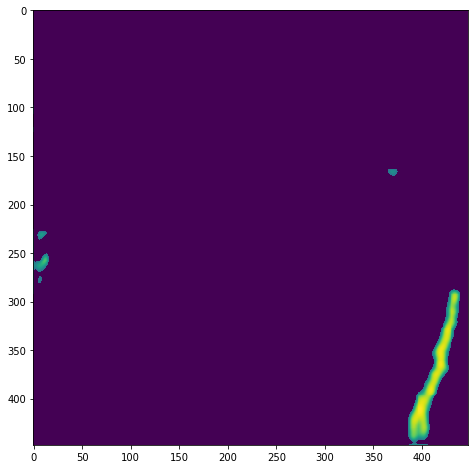

In [6]:
plt.figure(figsize=(8, 8))
plt.imshow(prob_map_full)
plt.show()

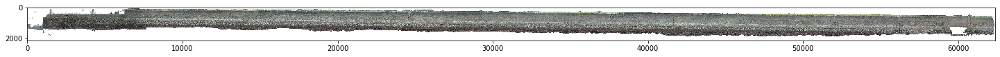

In [5]:
img = cv.imread("crack_image/side_A_B.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

fig = plt.figure(figsize=(25, 4))
plt.imshow(img)
plt.show()

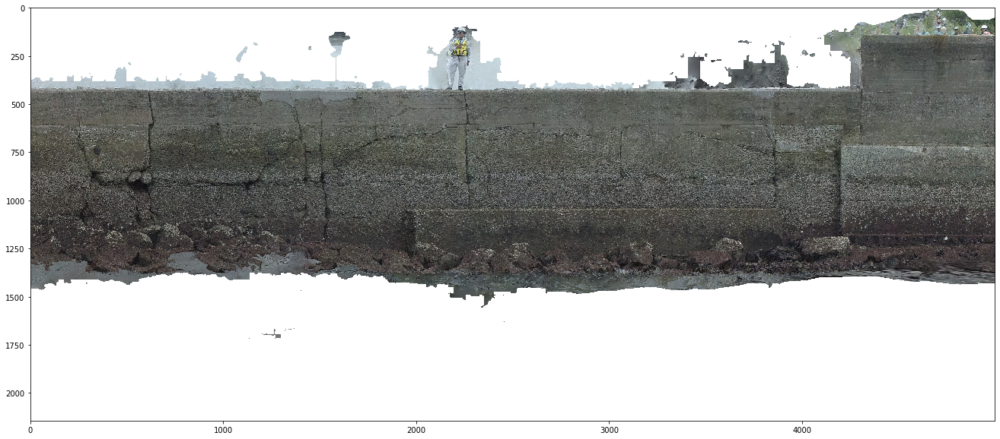

In [47]:
fig = plt.figure(figsize=(25, 10))
plt.imshow(img[:, 2000:7000, :])
plt.show()

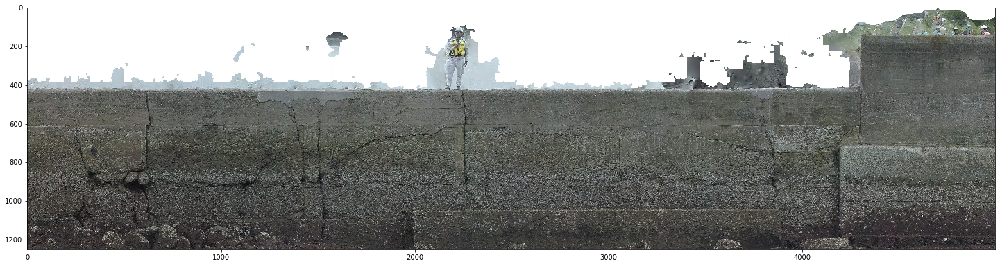

In [48]:
fig = plt.figure(figsize=(25, 10))
plt.imshow(img[:1250, 2000:7000, :])
plt.show()

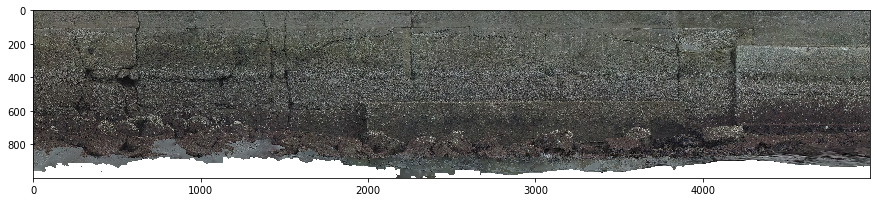

In [15]:
fig = plt.figure(figsize=(15, 5))
plt.imshow(img[500:1500, 2000:7000, :])
plt.show()

In [10]:
start_index = 0
width = 448
height = 448

# mask = np.zeros(img.shape[0:2], dtype=np.float32)
mask = np.sum(img, axis=2) / 3
mask[mask == 255] = 0
mask[mask != 0] = 1

out_masks = split_image(mask)
out_imgs = split_image(img)

results = []
for i, (out_img, out_mask) in enumerate(zip(out_imgs, out_masks)):
# out_img = out_imgs[200]
# out_mask = out_masks[200]
    n = out_mask[out_mask == 1].shape[0]
    if n <= width * height * 0.9:
        results.append(np.zeros((height, width),dtype=np.float32))
    else:
        prob_map_full = evaluate_img(model, out_img)
        prob_map_full[prob_map_full < 0.2] = 0
        results.append(prob_map_full)

(2144, 62392) -> (1792, 62272)
(2144, 62392, 3) -> (1792, 62272, 3)


In [11]:
vsize=448
hsize=448
out_imgs = np.array(results)
h, w = img.shape[:2]
num_vsplits, num_hsplits = np.floor_divide([h, w], [vsize, hsize])
# vsize, hsize, ch = img.shape
split_imgs = out_imgs.reshape(num_vsplits, num_hsplits, vsize, hsize, 1)
print(split_imgs.shape) # (5, 7, 96, 91, 3)

merged_img = np.vstack([np.hstack(h_imgs) for h_imgs in split_imgs])
merged_img = merged_img.reshape(merged_img.shape[0], merged_img.shape[1])

(4, 139, 448, 448, 1)


In [12]:
crack_img = np.zeros(img.shape, dtype=np.uint8)
crack_img[:merged_img.shape[0], :merged_img.shape[1], 0] = np.uint8(merged_img * 255)

In [13]:
dummy = cv.addWeighted(crack_img, 1, img, 1, 0, img)

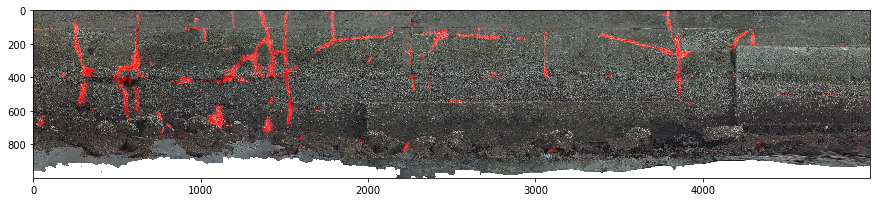

In [57]:
fig = plt.figure(figsize=(15, 5))
plt.imshow(dummy[500:1500, 2000:7000, :])
plt.show()

In [58]:
cv.imwrite('dummy_crop.jpg', cv.cvtColor(dummy[:1250, :, :], cv.COLOR_BGR2RGB))

True

In [13]:
from skimage import measure

In [14]:
label = crack_img.copy()[:, :, 0]
label[label > 0] = 1
label = measure.label(label, background=0, neighbors=8, connectivity=2)

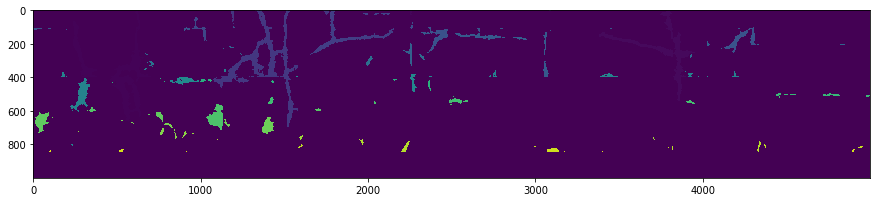

In [16]:
fig = plt.figure(figsize=(15, 5))
plt.imshow(label[500:1500, 2000:7000])

In [15]:
import matplotlib
color_map = plt.cm.jet
vals = np.linspace(0, 1, label.max())
np.random.shuffle(vals)
color_map = plt.cm.colors.ListedColormap(plt.cm.jet(vals))
norm = plt.Normalize(vmin=0, vmax=float(label[label != 0].max()))
# image = np.zeros((label.shape[0], label.shape[1], 4), dtype=np.uint8)
image = color_map(norm(label))
image = image[:, :, :3]
image[label == 0, :] = 0
image[:, :, :3] = image[:, :, :3] * 255
image = np.uint8(image)

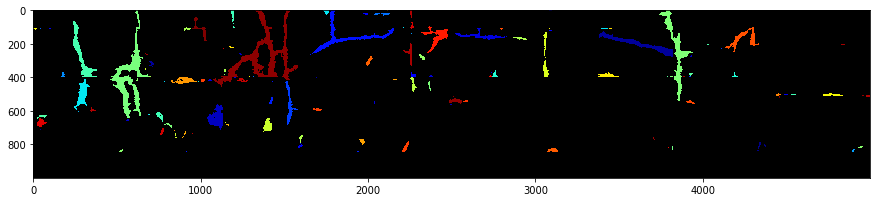

In [16]:
fig = plt.figure(figsize=(15, 5))
plt.imshow(image[500:1500, 2000:7000])
plt.show()

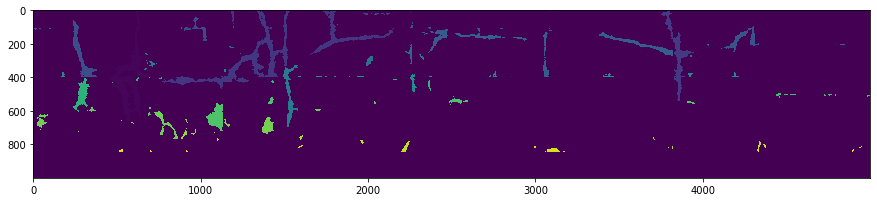

In [31]:
fig = plt.figure(figsize=(15, 5))
plt.imshow(label[500:1500, 2000:7000])
plt.show()

In [125]:
fig = plt.figure(figsize=(15, 5))
plt.imshow(mask[500:1500, 2000:7000, 3])
plt.show()

IndexError: too many indices for array

<Figure size 1080x360 with 0 Axes>

In [20]:
img.shape

(2144, 62392, 3)

In [18]:
dummy = cv.addWeighted(image, 0.7, img, 1, 2.2)

In [21]:
alpha_layer = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
alpha_layer[np.where(np.sum(img, axis=1) != 0)] = 1
input_img = np.zeros((img.shape[0], img.shape[1], 4), dtype=np.uint8)
input_img[:, :, :3] = img
input_img[:, :, 3] = alpha_layer

In [17]:
dummy = cv.addWeighted(image, 0, input_img, 1 - 0, 0)

NameError: name 'input_img' is not defined

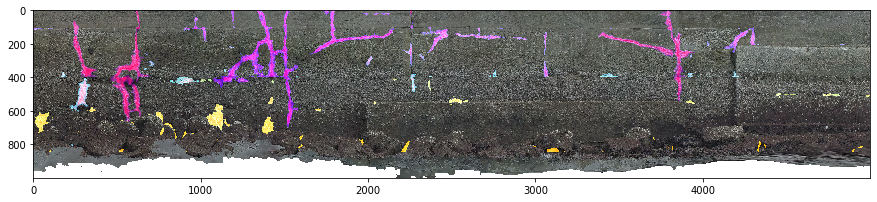

In [50]:
fig = plt.figure(figsize=(15, 5))
plt.imshow(dummy[500:1500, 2000:7000])
plt.show()

In [19]:
cv.imwrite('dummy_crop2.jpg', cv.cvtColor(dummy[:1250, :, :], cv.COLOR_BGR2RGB))

True

In [29]:
image[label != 0]

array([[  0,   0, 127,   1],
       [  0,   0, 127,   1],
       [  0,   0, 127,   1],
       ...,
       [200,   0,   0,   1],
       [200,   0,   0,   1],
       [200,   0,   0,   1]], dtype=uint8)

In [37]:
del dummy

In [94]:
from PIL import Image
overlay = Image.fromarray(np.uint8(plt.cm.jet(label)*255))
background = Image.open('crack_image/side_A_B.jpg')
new_img = Image.blend(background, overlay, 0.5)

C:\Users\kenta\.conda\envs\crack\lib\site-packages\PIL\Image.py:2735: DecompressionBombWarning: Image size (133768448 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


ValueError: images do not match

In [95]:
overlay

In [ ]:
background

In [64]:
merged_img.reshape(img.shape[:2])

ValueError: cannot reshape array of size 111591424 into shape (2144,62392)

In [68]:
print(img.shape, merged_img.shape)
print(img.shape[0] - merged_img.shape[0], img.shape[1] - merged_img.shape[1])

(2144, 62392, 3) (1792, 62272, 1)
352 120


In [ ]:
plt.figure(figsize=(8, 8))
plt.imshow(results[203])
plt.show()    

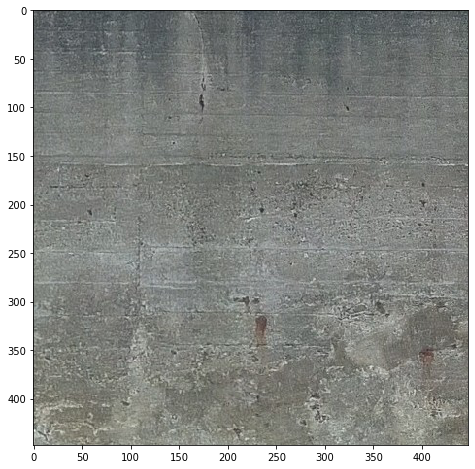

In [45]:
plt.figure(figsize=(8, 8))
plt.imshow(out_imgs[203])
plt.show()

In [ ]:
i = start_index
out_mask = out_masks[i]
out_img = out_imgs[i]
out_label = out_labels[i]
n = out_mask[out_mask == 1].shape[0]

if n <= width * height * 0.9:
    pass
else:

In [ ]:
for path in tqdm(paths):
    #print(str(path))

    train_tfms = transforms.Compose([transforms.ToTensor(), transforms.Normalize(channel_means, channel_stds)])

    img_0 = Image.open(str(path))
    img_0 = np.asarray(img_0)
    if len(img_0.shape) != 3:
        print(f'incorrect image shape: {path.name}{img_0.shape}')
        continue

    img_0 = img_0[:, :, :3]

    img_height, img_width, img_channels = img_0.shape

    prob_map_full = evaluate_img(model, img_0)

    if args.out_pred_dir != '':
        cv.imwrite(filename=join(args.out_pred_dir, f'{path.stem}.jpg'), img=(prob_map_full * 255).astype(np.uint8))

    if args.out_viz_dir != '':
        # plt.subplot(121)
        # plt.imshow(img_0), plt.title(f'{img_0.shape}')
        if img_0.shape[0] > 2000 or img_0.shape[1] > 2000:
            img_1 = cv.resize(img_0, None, fx=0.2, fy=0.2, interpolation=cv.INTER_AREA)
        else:
            img_1 = img_0
